# Objective:

In this competition, in addition to traditional forecasting methods, you’re also challenged to use machine learning to improve forecast accuracy.

In this competition, the fifth iteration, you will use hierarchical sales data from Walmart, the world’s largest company by revenue, to forecast daily sales for the next 28 days and to make uncertainty estimates for these forecasts. The data, cover stores in three US states (California, Texas, and Wisconsin) and includes item level, department, product categories, and store details. In addition, it has explanatory variables such as price, promotions, day of the week, and special events. Together, this robust dataset can be used to improve forecasting accuracy.

**In the challenge, you are predicting 9 quartiles of item sales at stores in various locations for two 28-day time periods. Information about the data is found in the M5 Participants Guide.**


**More specifically, the dataset involves the unit sales of 3,049 products, classified in 3 product categories (Hobbies, Foods, and Household) and 7 product departments, in which the above-mentioned categories are disaggregated**

The products are sold across ten stores, located in three States (CA, TX, and WI)

In [1]:
import pandas as pd
import numpy as np
from random import gauss
from pandas.plotting import autocorrelation_plot
import warnings
import itertools
from random import random

import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.ar_model import AR
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight') 
# import matplotlib as mpl
import seaborn as sns

In [2]:
#sales_train_evaluation d1-d1941
#sales_train_validation d1-d1913  =>28 test (validation)
#1969  => 1969-28=1941 (Forecasting)
sales_train = pd.read_csv('sales_train_evaluation.csv')
#sales_train

In [3]:
sales_train.columns

Index(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'd_1',
       'd_2', 'd_3', 'd_4',
       ...
       'd_1932', 'd_1933', 'd_1934', 'd_1935', 'd_1936', 'd_1937', 'd_1938',
       'd_1939', 'd_1940', 'd_1941'],
      dtype='object', length=1947)

In [4]:
sales_train=sales_train.drop(['id','item_id','dept_id','store_id'],axis = 1)

In [5]:
sales_train

,cat_id,state_id,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,...,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941
0,HOBBIES,CA,0,0,0,0,0,0,0,0,...,2,4,0,0,0,0,3,3,0,1
1,HOBBIES,CA,0,0,0,0,0,0,0,0,...,0,1,2,1,1,0,0,0,0,0
2,HOBBIES,CA,0,0,0,0,0,0,0,0,...,1,0,2,0,0,0,2,3,0,1
3,HOBBIES,CA,0,0,0,0,0,0,0,0,...,1,1,0,4,0,1,3,0,2,6
4,HOBBIES,CA,0,0,0,0,0,0,0,0,...,0,0,0,2,1,0,0,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,FOODS,WI,0,0,2,2,0,3,1,4,...,1,0,3,0,1,1,0,0,1,1
30486,FOODS,WI,0,0,0,0,0,5,0,1,...,0,0,0,0,0,0,1,0,1,0
30487,FOODS,WI,0,6,0,2,2,4,1,8,...,0,0,1,2,0,1,0,1,0,2
30488,FOODS,WI,0,0,0,0,0,0,0,0,...,1,1,1,4,6,0,1,1,1,0


In [6]:
sales_train= sales_train.groupby(['state_id','cat_id']).sum()
#sales_train

In [7]:
sales_train = sales_train.reset_index()
#sales_train

In [8]:
sales_train ['State_Catecory'] = sales_train ['state_id']+ '_'+ sales_train['cat_id']
#sales_train['date'] = df['date'].str[1:].astype('int')
#sales_train.head(20)

In [9]:
sales_train = sales_train.set_index('State_Catecory')
#sales_train

In [10]:
sales_train=sales_train.drop(['state_id','cat_id'],axis = 1)
sales_train

,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,...,d_1932,d_1933,d_1934,d_1935,d_1936,d_1937,d_1938,d_1939,d_1940,d_1941
State_Catecory,,,,,,,,,,,,,,,,,,,,,
CA_FOODS,10101,9862,6944,7864,7178,8256,9005,11870,10977,8637,...,12151,14447,16197,11859,10759,10465,10650,11354,14489,15970
CA_HOBBIES,1802,1561,1472,1405,1181,1459,1314,1986,1482,1508,...,1831,2638,2401,1554,1649,1606,1735,1975,2701,2514
CA_HOUSEHOLD,2292,2382,1692,1778,1566,1607,1932,2754,2237,1677,...,4489,5952,6106,4308,3742,3607,3912,4101,5913,6160
TX_FOODS,6853,7030,5124,5470,4602,7067,4671,7055,6920,5505,...,8369,8095,10663,7905,7164,6596,6083,7965,8834,9500
TX_HOBBIES,879,870,526,809,501,831,390,785,794,524,...,1028,933,1461,1205,1199,1056,830,1132,1440,1543
TX_HOUSEHOLD,1706,1730,1128,1102,809,1108,1165,1600,1662,1290,...,2923,3338,4125,3118,3007,2723,2249,3206,3407,3772
WI_FOODS,6224,5866,5106,5544,2823,6770,6814,8826,6965,4759,...,9587,14034,14587,9394,8225,7729,8004,8817,10276,10497
WI_HOBBIES,1083,926,684,455,132,930,1240,1215,623,583,...,1012,1322,1154,769,781,1078,910,1036,1192,1223
WI_HOUSEHOLD,1691,1522,1107,985,354,1183,1479,1841,1076,1089,...,2683,3549,3227,2250,2251,2236,2590,2966,3266,3159


In [11]:
sales_train=sales_train.T
sales_train

State_Catecory,CA_FOODS,CA_HOBBIES,CA_HOUSEHOLD,TX_FOODS,TX_HOBBIES,TX_HOUSEHOLD,WI_FOODS,WI_HOBBIES,WI_HOUSEHOLD
d_1,10101,1802,2292,6853,879,1706,6224,1083,1691
d_2,9862,1561,2382,7030,870,1730,5866,926,1522
d_3,6944,1472,1692,5124,526,1128,5106,684,1107
d_4,7864,1405,1778,5470,809,1102,5544,455,985
d_5,7178,1181,1566,4602,501,809,2823,132,354
...,...,...,...,...,...,...,...,...,...
d_1937,10465,1606,3607,6596,1056,2723,7729,1078,2236
d_1938,10650,1735,3912,6083,830,2249,8004,910,2590
d_1939,11354,1975,4101,7965,1132,3206,8817,1036,2966
d_1940,14489,2701,5913,8834,1440,3407,10276,1192,3266


In [12]:
DatetimeIndex = pd.date_range('29/01/2011','22/05/2016')
DatetimeIndex

DatetimeIndex(['2011-01-29', '2011-01-30', '2011-01-31', '2011-02-01',
               '2011-02-02', '2011-02-03', '2011-02-04', '2011-02-05',
               '2011-02-06', '2011-02-07',
               ...
               '2016-05-13', '2016-05-14', '2016-05-15', '2016-05-16',
               '2016-05-17', '2016-05-18', '2016-05-19', '2016-05-20',
               '2016-05-21', '2016-05-22'],
              dtype='datetime64[ns]', length=1941, freq='D')

In [13]:
sales_train['Date']= DatetimeIndex
sales_train = sales_train.set_index('Date')
#sales_train

In [14]:
sales_train = sales_train.reset_index()
#sales_train

In [15]:
#sales_train.columns

In [16]:
from matplotlib import pyplot as plt
# time series - statsmodels 
# Seasonality decomposition
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.seasonal import seasonal_decompose 
# holt winters 
# single exponential smoothing
from statsmodels.tsa.holtwinters import SimpleExpSmoothing   
# double and triple exponential smoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing

In [17]:
#sales_train['Year']=sales_train['Date'].dt.year
#sales_train['Month']= sales_train['Date'].dt.month
#sales_train = sales_train.set_index('Year')
#sales_train = sales_train.set_index('Month')


In [18]:
#sales_train.index.name = None

In [19]:
#sales_train.columns

In [20]:
#sales_train= sales_train.groupby(['Year','Month']).sum()
#sales_train

#prepare dataset of evaluation
sales_train_eva = pd.read_csv('sales_train_evaluation.csv')
sales_train_eva= sales_train_eva.groupby(['state_id','cat_id']).sum()
sales_train_eva = sales_train_eva.reset_index()
sales_train_eva ['State_Catecory'] = sales_train_eva ['state_id']+ '_'+ sales_train_eva['cat_id']
sales_train_eva = sales_train_eva.set_index('State_Catecory')
sales_train_eva=sales_train_eva.T
DatetimeIndex = pd.date_range('29/01/2011','22/05/2016')
sales_train_eva['Date']= DatetimeIndex
sales_train_eva = sales_train_eva.set_index('Date')
sales_train_eva = sales_train_eva.reset_index()

sales_train_eva=sales_train_eva.drop(['id','item_id','dept_id','store_id','state_id','cat_id'],axis = 1)

sales_train_eva.columns

### Exponencial Smoothing Model

CA_FOODS

<AxesSubplot:title={'center':'CA_FOODS sales'}, xlabel='Date'>

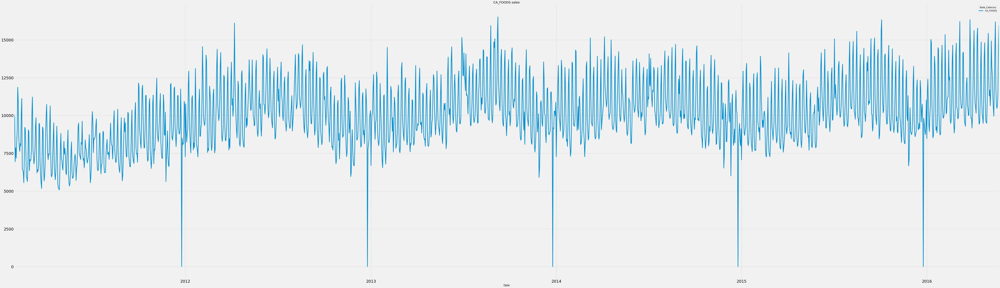

In [21]:
sales_train = sales_train.set_index('Date')
sales_train[['CA_FOODS']].plot(title='CA_FOODS sales',figsize=(100,30),fontsize=25)
#plt.title("y=x$^{2}$", fontdict={'fontsize': 12})

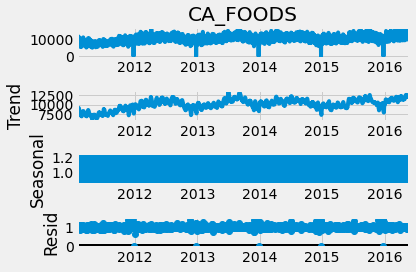

In [22]:
decompose_result = seasonal_decompose(sales_train['CA_FOODS'],model='multiplicative')
decompose_result.plot();

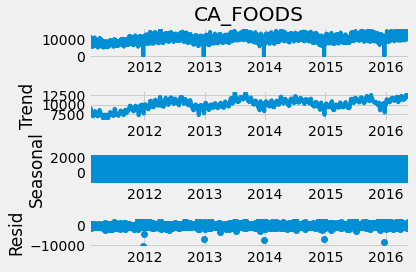

In [23]:
decompose_result = seasonal_decompose(sales_train['CA_FOODS'],model='additive')
decompose_result.plot();

In [24]:
sales_train.index.freq 
# Set the value of Alpha and define m (Time Period)
m = 12
alpha=0.2

C:\Users\Cheri\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\Cheri\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


<AxesSubplot:title={'center':'CA_FOODS_SALES Single Exponential Smoothing'}, xlabel='Date'>

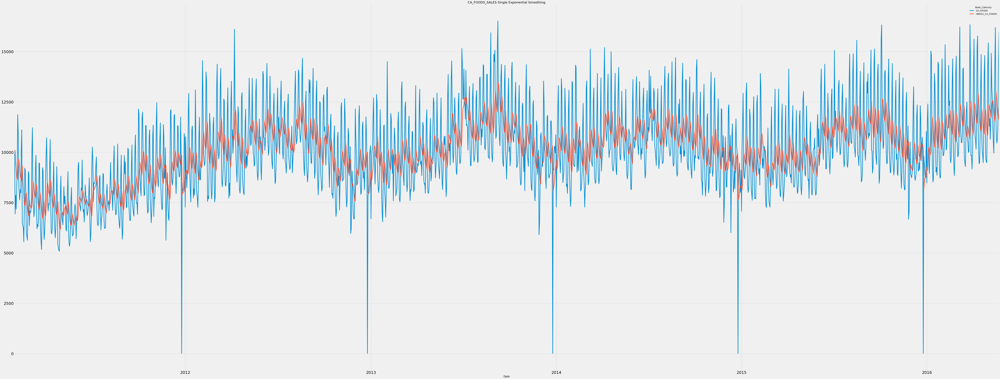

In [25]:
sales_train['HWES1_CA_FOODS'] = SimpleExpSmoothing(sales_train['CA_FOODS']).fit(smoothing_level=alpha,optimized=False,use_brute=True).fittedvalues
sales_train[['CA_FOODS','HWES1_CA_FOODS']].plot(title='CA_FOODS_SALES Single Exponential Smoothing',figsize=(100,40),fontsize=25)

In [26]:
from sklearn.metrics import mean_absolute_error,mean_squared_error
print(f'Mean Absolute Error = {mean_absolute_error(sales_train.CA_FOODS,sales_train.HWES1_CA_FOODS)}')
print(f'Mean Squared Error = {mean_squared_error(sales_train.CA_FOODS,sales_train.HWES1_CA_FOODS)}')

Mean Absolute Error = 1528.8204099468333
Mean Squared Error = 3476766.094796207


In [27]:
#sales_train.columns

C:\Users\Cheri\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\Cheri\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\Users\Cheri\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
C:\Users\Cheri\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\Cheri\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


<AxesSubplot:title={'center':'sales_train Double Exponential Smoothing: Multiplicative Trend'}, xlabel='Date'>

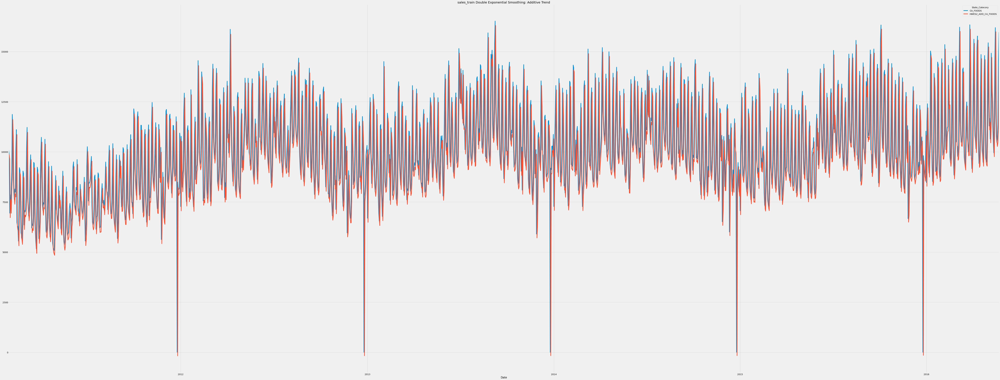

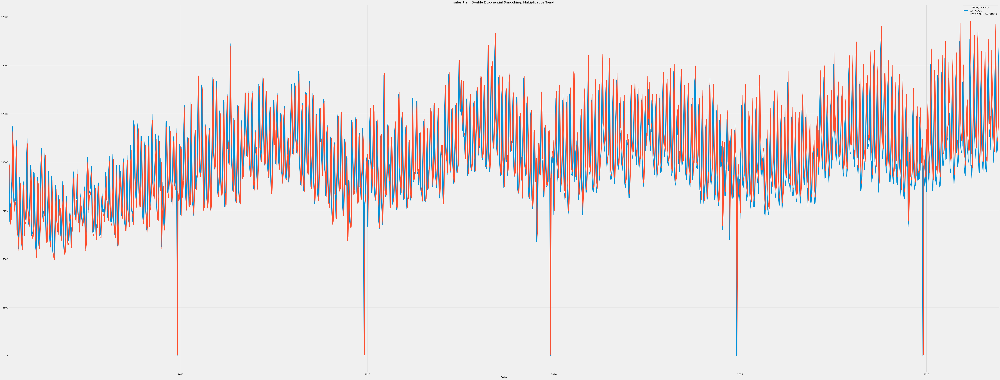

In [28]:
sales_train['HWES2_ADD_CA_FOODS'] = ExponentialSmoothing(sales_train['CA_FOODS'],trend='add').fit().fittedvalues
sales_train['HWES2_MUL_CA_FOODS'] = ExponentialSmoothing(sales_train['CA_FOODS'],trend='mul').fit().fittedvalues

sales_train[['CA_FOODS','HWES2_ADD_CA_FOODS']].plot(title='sales_train Double Exponential Smoothing: Additive Trend',figsize=(100,40))
sales_train[['CA_FOODS','HWES2_MUL_CA_FOODS']].plot(title='sales_train Double Exponential Smoothing: Multiplicative Trend',figsize=(100,40))


In [29]:
from sklearn.metrics import mean_absolute_error,mean_squared_error
print(f'Mean Absolute Error = {mean_absolute_error(sales_train.CA_FOODS,sales_train.HWES2_ADD_CA_FOODS)}')
print(f'Mean Squared Error = {mean_squared_error(sales_train.CA_FOODS,sales_train.HWES2_ADD_CA_FOODS)}')
print(f'Mean Absolute Error = {mean_absolute_error(sales_train.CA_FOODS,sales_train.HWES2_MUL_CA_FOODS)}')
print(f'Mean Squared Error = {mean_squared_error(sales_train.CA_FOODS,sales_train.HWES2_MUL_CA_FOODS)}')

Mean Absolute Error = 1349.3919947991812
Mean Squared Error = 3277926.7810042202
Mean Absolute Error = 1342.455952996949
Mean Squared Error = 3371256.5607239343


C:\Users\Cheri\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\Cheri\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\Users\Cheri\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
C:\Users\Cheri\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\Cheri\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:80: RuntimeWarning: overflow encountered in matmul
  return err.T @ err
C:\Users\Cheri\anaconda3\lib\site-packages\statsmodels\ts

<AxesSubplot:title={'center':'CA_FOODS Triple Exponential Smoothing: Multiplicative Seasonality'}, xlabel='Date'>

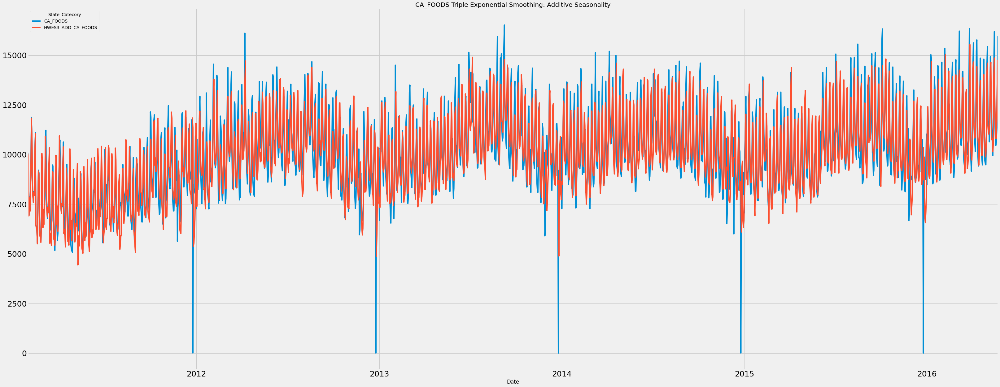

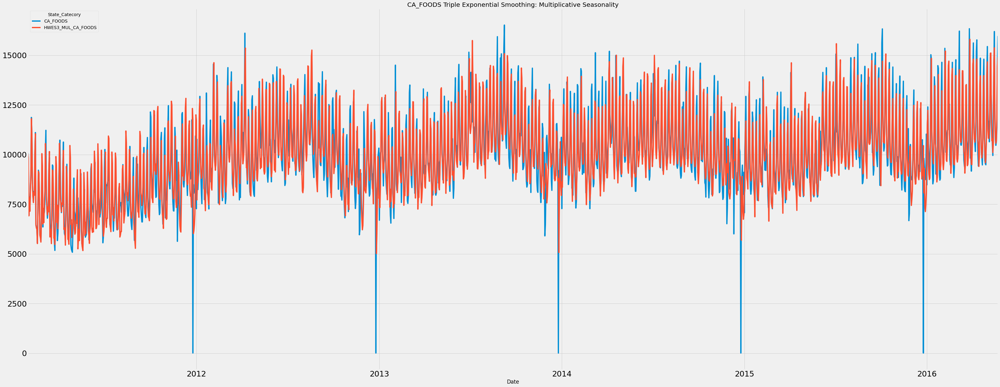

In [30]:
sales_train['HWES3_ADD_CA_FOODS'] = ExponentialSmoothing(sales_train['CA_FOODS'],trend='add',seasonal='add',seasonal_periods=28).fit().fittedvalues
sales_train['HWES3_MUL_CA_FOODS'] = ExponentialSmoothing(sales_train['CA_FOODS'],trend='mul',seasonal='mul',seasonal_periods=28).fit().fittedvalues
sales_train[['CA_FOODS','HWES3_ADD_CA_FOODS']].plot(title='CA_FOODS Triple Exponential Smoothing: Additive Seasonality',figsize=(50,20),fontsize=25)
sales_train[['CA_FOODS','HWES3_MUL_CA_FOODS']].plot(title='CA_FOODS Triple Exponential Smoothing: Multiplicative Seasonality',figsize=(50,20),fontsize=25)

In [31]:
from sklearn.metrics import mean_absolute_error,mean_squared_error
print(f'Mean Absolute Error = {mean_absolute_error(sales_train.CA_FOODS,sales_train.HWES3_ADD_CA_FOODS)}')
print(f'Mean Squared Error = {mean_squared_error(sales_train.CA_FOODS,sales_train.HWES3_ADD_CA_FOODS)}')
print(f'Mean Absolute Error = {mean_absolute_error(sales_train.CA_FOODS,sales_train.HWES3_MUL_CA_FOODS)}')
print(f'Mean Squared Error = {mean_squared_error(sales_train.CA_FOODS,sales_train.HWES3_MUL_CA_FOODS)}')

Mean Absolute Error = 729.9476978178535
Mean Squared Error = 1131846.8508933017
Mean Absolute Error = 726.8265732984536
Mean Squared Error = 1134484.4453471296


###compare the MAE and MSE, the smaller value is better for the model prediction,so use additive model



In [32]:
#forecast_data = pd.read_csv('calendar.csv',index_col='date',parse_dates=True)
#frt_data = pd.read_csv(r'E:\Fifth year ESC Rennes\Time Series Analysis\group project\Electric_Production.csv',index_col='DATE', parse_dates=True)

#frt_data.index.freq = 'MS'
# Split into train and test set
#sales_train = sales_train.reset_index('Date')
#forecast_data = sales_train
train_sales_train = sales_train[:1913]
test_sales_train = sales_train[1913:]

In [33]:
#fitted_model = ExponentialSmoothing(train_sales_train['CA_FOODS'],trend='mul',seasonal='mul',seasonal_periods=28).fit()
#test_predictions = fitted_model.forecast(1941-1913)
#train_sales_train['CA_FOODS'].plot(legend=True,label='TRAIN')
#test_sales_train['CA_FOODS'].plot(legend=True,label='TEST',figsize=(50,20),fontsize= 25)
#test_predictions.plot(legend=True,label='PREDICTION')

#plt.title('Train, Test and Predicted Test using Holt Winters',size = 15)

C:\Users\Cheri\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\Cheri\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\Users\Cheri\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
C:\Users\Cheri\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)


Text(0.5, 1.0, 'Train, Test and Predicted Test using Holt Winters')

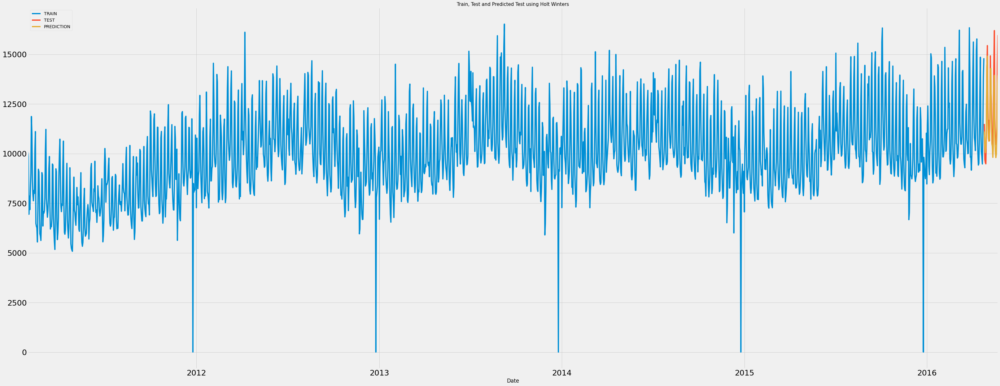

In [34]:
fitted_model = ExponentialSmoothing(train_sales_train['CA_FOODS'],trend='add',seasonal='add',seasonal_periods=28).fit()
test_predictions = fitted_model.forecast(1941-1913)
train_sales_train['CA_FOODS'].plot(legend=True,label='TRAIN')
test_sales_train['CA_FOODS'].plot(legend=True,label='TEST',figsize=(50,20),fontsize= 25)
test_predictions.plot(legend=True,label='PREDICTION')

plt.title('Train, Test and Predicted Test using Holt Winters',size = 15)

<AxesSubplot:xlabel='Date'>

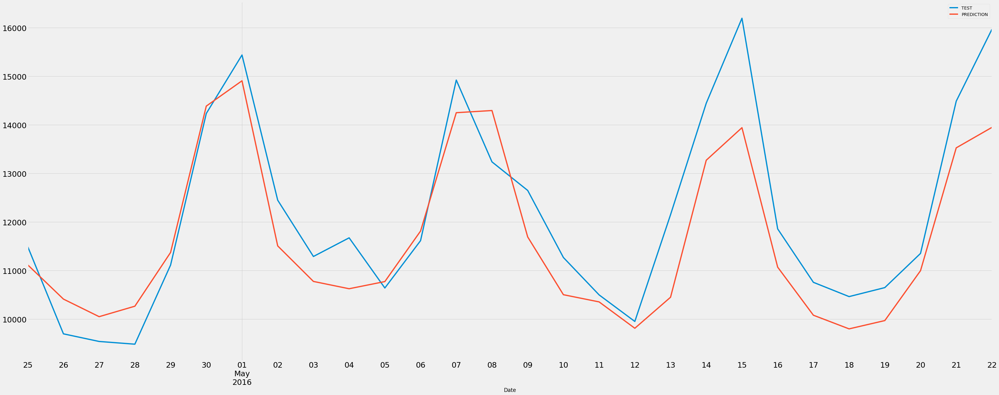

In [35]:
test_sales_train['CA_FOODS'].plot(legend=True,label='TEST',figsize=(50,20),fontsize = 25)
test_predictions.plot(legend=True,label='PREDICTION',fontsize = 25)

In [36]:
from sklearn.metrics import mean_absolute_error,mean_squared_error
print(f'Mean Absolute Error = {mean_absolute_error(test_sales_train.CA_FOODS,test_predictions)}')
print(f'Mean Squared Error = {mean_squared_error(test_sales_train.CA_FOODS,test_predictions)}')

Mean Absolute Error = 756.0725255028876
Mean Squared Error = 849201.0314916292


In [37]:
fitted_model.predict(start = 1940,end = 1968)
Pred=fitted_model.predict(start = 1940,end = 1968)

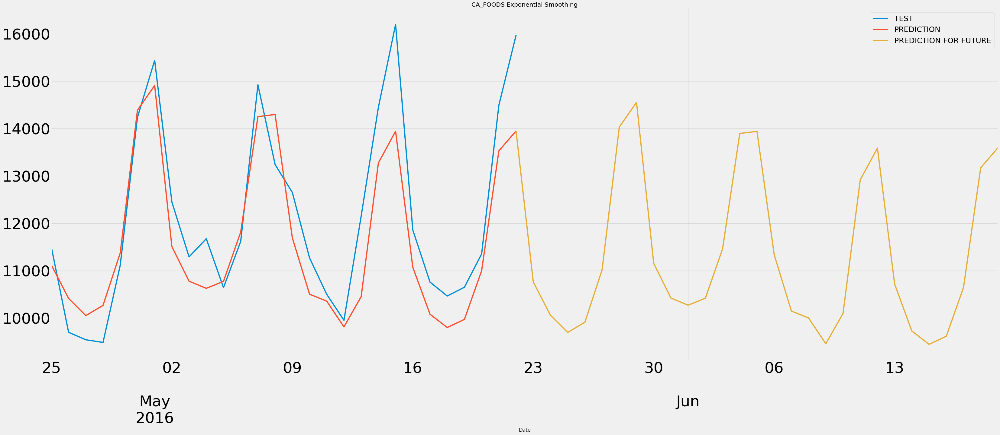

In [38]:
test_sales_train['CA_FOODS'].plot(legend=True,label='TEST',figsize=(50,20),fontsize=50)
test_predictions.plot(legend=True,label='PREDICTION',fontsize=50)
#plt.legend(prop={'size':25})
#axes.titlesize      : large

Pred.plot(title='CA_FOODS Exponential Smoothing',figsize=(50,20),legend=True,label='PREDICTION FOR FUTURE',fontsize=50)
plt.legend(prop={'size':25})


In [39]:
Pred

2016-05-22    13949.383842
2016-05-23    10762.517576
2016-05-24    10057.774064
2016-05-25     9695.837140
2016-05-26     9911.289053
2016-05-27    11018.195222
2016-05-28    14031.884800
2016-05-29    14553.256911
2016-05-30    11152.677089
2016-05-31    10421.561767
2016-06-01    10270.995583
2016-06-02    10418.630710
2016-06-03    11458.825849
2016-06-04    13896.129312
2016-06-05    13940.709648
2016-06-06    11337.919453
2016-06-07    10148.167022
2016-06-08     9999.929966
2016-06-09     9457.270138
2016-06-10    10095.936478
2016-06-11    12917.251789
2016-06-12    13587.577234
2016-06-13    10715.560378
2016-06-14     9725.775937
2016-06-15     9444.581155
2016-06-16     9615.459175
2016-06-17    10642.892793
2016-06-18    13172.105152
2016-06-19    13593.641386
Freq: D, dtype: float64

CA_HOBBIES

In [40]:
sales_train = sales_train.set_index('Date')
sales_train[['CA_HOBBIES']].plot(title='CA_HOBBIES sales',figsize=(100,30),fontsize=25)

decompose_result = seasonal_decompose(sales_train['CA_HOBBIES '],model='multiplicative')
decompose_result = seasonal_decompose(sales_train['CA_HOBBIES '],model='additive')

sales_train.index.freq 
m = 12
alpha=0.2

sales_train['HWES3_ADD_CA_HOBBIES'] = ExponentialSmoothing(sales_train['CA_HOBBIES'],trend='add',seasonal='add',seasonal_periods=28).fit().fittedvalues
sales_train['HWES3_MUL_CA_HOBBIES'] = ExponentialSmoothing(sales_train['CA_HOBBIES'],trend='mul',seasonal='mul',seasonal_periods=28).fit().fittedvalues
sales_train[['CA_HOBBIES','HWES3_ADD_CA_HOBBIES']].plot(title='CA_HOBBIES Triple Exponential Smoothing: Additive Seasonality',figsize=(50,20),fontsize=25)
sales_train[['CA_HOBBIES','HWES3_MUL_CA_HOBBIES']].plot(title='CA_HOBBIES Triple Exponential Smoothing: Multiplicative Seasonality',figsize=(50,20),fontsize=25)

print(f'Mean Absolute Error = {mean_absolute_error(sales_train.CA_HOBBIES,sales_train.HWES3_ADD_CA_HOBBIES)}')
print(f'Mean Squared Error = {mean_squared_error(sales_train.CA_HOBBIES,sales_train.HWES3_ADD_CA_HOBBIES)}')
print(f'Mean Absolute Error = {mean_absolute_error(sales_train.CA_HOBBIES,sales_train.HWES3_MUL_CA_HOBBIES)}')
print(f'Mean Squared Error = {mean_squared_error(sales_train.CA_HOBBIES,sales_train.HWES3_MUL_CA_HOBBIES)}')



KeyError: "None of ['Date'] are in the columns"